# BANK MARKETING: Predicting Whether The Customer Will Subscribe To Term Deposit (FIXED DEPOSIT) or not.

Your client is a retail banking institution. Term deposits are a major source of income for a bank. A term deposit is a cash investment held at a financial institution. Your money is invested for an agreed rate of interest over a fixed amount of time, or term. The bank has various outreach plans to sell term deposits to their customers such as email marketing, advertisements, telephonic marketing and digital marketing. Telephonic marketing campaigns still remain one of the most effective way to reach out to people. However, they require huge investment as large call centers are hired to actually execute these campaigns. Hence, it is crucial to identify the customers most likely to convert beforehand so that they can be specifically targeted via call.
You are provided with the client data such as : age of the client, their job type, their marital status, etc. Along with the client data, you are also provided with the information of the call such as the duration of the call, day and month of the call, etc. Given this information, your task is to predict if the client will subscribe to term deposit.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import sklearn

In [2]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset5/main/termdeposit_train.csv')
df

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,admin.,married,unknown,no,1933,no,no,telephone,19,nov,44,2,-1,0,unknown,no
1,40576,31,unknown,married,secondary,no,3,no,no,cellular,20,jul,91,2,-1,0,unknown,no
2,15320,27,services,married,secondary,no,891,yes,no,cellular,18,jul,240,1,-1,0,unknown,no
3,43962,57,management,divorced,tertiary,no,3287,no,no,cellular,22,jun,867,1,84,3,success,yes
4,29842,31,technician,married,secondary,no,119,yes,no,cellular,4,feb,380,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,management,single,tertiary,no,0,yes,no,cellular,12,may,116,2,-1,0,unknown,no
31643,40178,53,management,divorced,tertiary,no,380,no,yes,cellular,5,jun,438,2,-1,0,unknown,yes
31644,19710,32,management,single,tertiary,no,312,no,no,cellular,7,aug,37,3,-1,0,unknown,no
31645,38556,57,technician,married,secondary,no,225,yes,no,telephone,15,may,22,7,337,12,failure,no


Observation-  As we can see the data is in 'str' formate, we will first convert the data in 'numeric' with the help of the label encoder

In [3]:
from sklearn.preprocessing import LabelEncoder

In [4]:
le=LabelEncoder()

In [5]:
df['job']=le.fit_transform(df['job'])

In [6]:
df['marital']=le.fit_transform(df['marital'])

In [7]:
df['education']=le.fit_transform(df['education'])

In [8]:
df['default']=le.fit_transform(df['default'])

In [9]:
df['housing']=le.fit_transform(df['housing'])

In [10]:
df['loan']=le.fit_transform(df['loan'])

In [11]:
df['contact']=le.fit_transform(df['contact'])

In [12]:
df['month']=le.fit_transform(df['month'])

In [13]:
df['poutcome']=le.fit_transform(df['poutcome'])

In [14]:
df['subscribed']=le.fit_transform(df['subscribed'])

Observation- Applied label encoder to all the 'str' columns and converted the data in 'numeric' form.

In [15]:
df

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,0,1,3,0,1933,0,0,1,19,9,44,2,-1,0,3,0
1,40576,31,11,1,1,0,3,0,0,0,20,5,91,2,-1,0,3,0
2,15320,27,7,1,1,0,891,1,0,0,18,5,240,1,-1,0,3,0
3,43962,57,4,0,2,0,3287,0,0,0,22,6,867,1,84,3,2,1
4,29842,31,9,1,1,0,119,1,0,0,4,3,380,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,4,2,2,0,0,1,0,0,12,8,116,2,-1,0,3,0
31643,40178,53,4,0,2,0,380,0,1,0,5,6,438,2,-1,0,3,1
31644,19710,32,4,2,2,0,312,0,0,0,7,1,37,3,-1,0,3,0
31645,38556,57,9,1,1,0,225,1,0,1,15,8,22,7,337,12,0,0


In [16]:
df.shape

(31647, 18)

In [17]:
df.columns

Index(['ID', 'age', 'job', 'marital', 'education', 'default', 'balance',
       'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign',
       'pdays', 'previous', 'poutcome', 'subscribed'],
      dtype='object')

In [18]:
df.ndim


2

In [19]:
df.min()

ID               2
age             18
job              0
marital          0
education        0
default          0
balance      -8019
housing          0
loan             0
contact          0
day              1
month            0
duration         0
campaign         1
pdays           -1
previous         0
poutcome         0
subscribed       0
dtype: int64

In [20]:
df.max()

ID             45211
age               95
job               11
marital            2
education          3
default            1
balance       102127
housing            1
loan               1
contact            2
day               31
month             11
duration        4918
campaign          63
pdays            871
previous         275
poutcome           3
subscribed         1
dtype: int64

In [21]:
df.marital.unique()

array([1, 0, 2])

Checking the count of marital column

In [22]:
df.marital.value_counts()

1    19095
2     8922
0     3630
Name: marital, dtype: int64

Graphical representation of the marital column

1    19095
2     8922
0     3630
Name: marital, dtype: int64


<AxesSubplot:xlabel='marital', ylabel='count'>

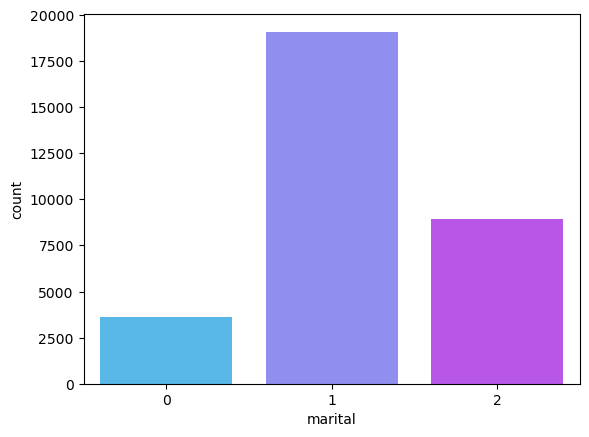

In [23]:
print(df['marital'].value_counts())
sns.countplot(df['marital'],palette="cool")

In [24]:
df.job.unique()

array([ 0, 11,  7,  4,  9,  5,  1,  3,  6,  8,  2, 10])

In [25]:
df.job.value_counts()

1     6842
4     6639
9     5307
0     3631
7     2903
5     1574
6     1123
2     1008
10     905
3      874
8      635
11     206
Name: job, dtype: int64

1     6842
4     6639
9     5307
0     3631
7     2903
5     1574
6     1123
2     1008
10     905
3      874
8      635
11     206
Name: job, dtype: int64


<AxesSubplot:xlabel='job', ylabel='count'>

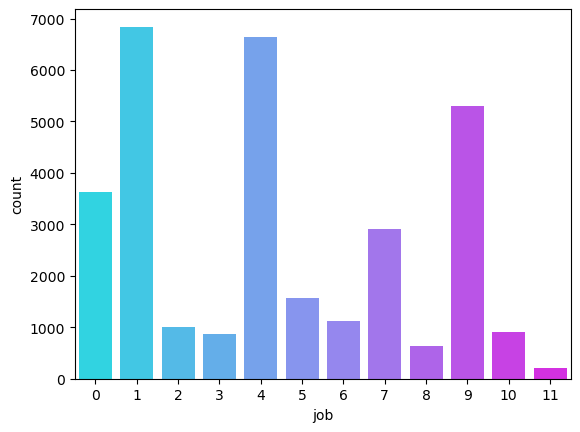

In [26]:
print(df['job'].value_counts())
sns.countplot(df['job'],palette="cool")

In [27]:
df.education.unique()

array([3, 1, 2, 0])

In [28]:
df.education.value_counts()

1    16224
2     9301
0     4808
3     1314
Name: education, dtype: int64

1    16224
2     9301
0     4808
3     1314
Name: education, dtype: int64


<AxesSubplot:xlabel='education', ylabel='count'>

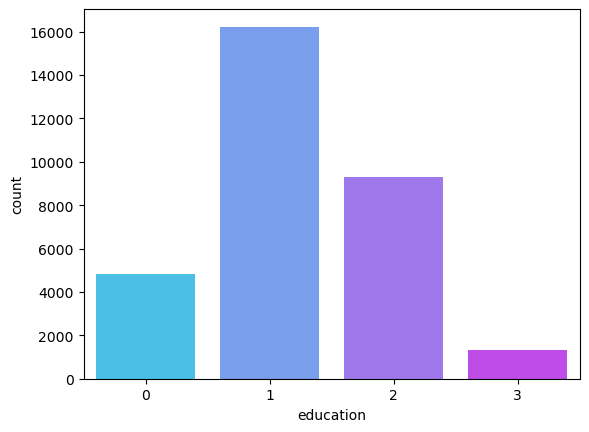

In [29]:
print(df['education'].value_counts())
sns.countplot(df['education'],palette="cool")

In [30]:
df.head(10)

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,0,1,3,0,1933,0,0,1,19,9,44,2,-1,0,3,0
1,40576,31,11,1,1,0,3,0,0,0,20,5,91,2,-1,0,3,0
2,15320,27,7,1,1,0,891,1,0,0,18,5,240,1,-1,0,3,0
3,43962,57,4,0,2,0,3287,0,0,0,22,6,867,1,84,3,2,1
4,29842,31,9,1,1,0,119,1,0,0,4,3,380,1,-1,0,3,0
5,29390,33,4,2,2,0,0,1,0,0,2,3,116,3,-1,0,3,0
6,40444,56,5,1,1,0,1044,0,0,1,3,5,353,2,-1,0,3,1
7,40194,50,9,2,1,0,1811,0,0,0,8,6,97,4,-1,0,3,0
8,29824,45,1,0,1,0,1951,1,0,0,4,3,692,1,-1,0,3,0
9,44676,35,0,1,1,0,1204,0,0,0,3,11,789,2,-1,0,3,0


In [31]:
df.tail(10)

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
31637,20110,44,9,1,1,0,5163,0,0,0,11,1,48,2,-1,0,3,0
31638,16309,29,1,1,1,0,721,1,0,0,23,5,644,1,-1,0,3,0
31639,279,38,7,2,1,0,570,1,0,2,5,8,75,2,-1,0,3,0
31640,12109,43,4,2,1,0,2968,0,0,2,20,6,30,4,-1,0,3,0
31641,9476,37,9,2,2,0,1309,0,0,2,6,6,442,2,-1,0,3,0
31642,36483,29,4,2,2,0,0,1,0,0,12,8,116,2,-1,0,3,0
31643,40178,53,4,0,2,0,380,0,1,0,5,6,438,2,-1,0,3,1
31644,19710,32,4,2,2,0,312,0,0,0,7,1,37,3,-1,0,3,0
31645,38556,57,9,1,1,0,225,1,0,1,15,8,22,7,337,12,0,0
31646,14156,55,4,0,1,0,204,1,0,0,11,5,1973,2,-1,0,3,1


Checking for the null values via @info

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31647 entries, 0 to 31646
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   ID          31647 non-null  int64
 1   age         31647 non-null  int64
 2   job         31647 non-null  int32
 3   marital     31647 non-null  int32
 4   education   31647 non-null  int32
 5   default     31647 non-null  int32
 6   balance     31647 non-null  int64
 7   housing     31647 non-null  int32
 8   loan        31647 non-null  int32
 9   contact     31647 non-null  int32
 10  day         31647 non-null  int64
 11  month       31647 non-null  int32
 12  duration    31647 non-null  int64
 13  campaign    31647 non-null  int64
 14  pdays       31647 non-null  int64
 15  previous    31647 non-null  int64
 16  poutcome    31647 non-null  int32
 17  subscribed  31647 non-null  int32
dtypes: int32(10), int64(8)
memory usage: 3.1 MB


In [33]:
df.isnull().sum()

ID            0
age           0
job           0
marital       0
education     0
default       0
balance       0
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
subscribed    0
dtype: int64

Observation- No null value present in the dataset

In [34]:
df.describe()

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
count,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000
mean,22563.972162,40.957247,4.332923,1.167220,1.225013,0.018485,1363.890258,0.555629,0.162132,0.644642,15.835466,5.533131,258.113534,2.765697,39.576042,0.574272,2.566152,0.117389
std,13075.936990,10.625134,3.271868,0.607186,0.749195,0.134700,3028.304293,0.496904,0.368578,0.899480,8.337097,3.004247,257.118973,3.113830,99.317592,2.422529,0.982069,0.321888
min,2.000000,18.000000,0.000000,0.000000,0.000000,0.000000,-8019.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,-1.000000,0.000000,0.000000,0.000000
25%,11218.000000,33.000000,1.000000,1.000000,1.000000,0.000000,73.000000,0.000000,0.000000,0.000000,8.000000,3.000000,104.000000,1.000000,-1.000000,0.000000,3.000000,0.000000
50%,22519.000000,39.000000,4.000000,1.000000,1.000000,0.000000,450.000000,1.000000,0.000000,0.000000,16.000000,6.000000,180.000000,2.000000,-1.000000,0.000000,3.000000,0.000000
75%,33879.500000,48.000000,7.000000,2.000000,2.000000,0.000000,1431.000000,1.000000,0.000000,2.000000,21.000000,8.000000,318.500000,3.000000,-1.000000,0.000000,3.000000,0.000000
max,45211.000000,95.000000,11.000000,2.000000,3.000000,1.000000,102127.000000,1.000000,1.000000,2.000000,31.000000,11.000000,4918.000000,63.000000,871.000000,275.000000,3.000000,1.000000


Observations :- Standard Deviation is high in "age","balance","duration","pdays" hence there is the possibilities of Outliers in this columns

mean>median in "balance" column hence there is a possibilities of skewness in the data

There is a high difference in 75% and max value hence there is a possibility of outliers in "Age", "balance","Duration"columns

Finding the correlation between the given data

In [35]:
dfcor=df.corr()
dfcor

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
ID,1.000000,0.013337,0.061805,0.086454,0.096480,-0.051521,0.067897,-0.180047,-0.086140,-0.723830,-0.063399,-0.165274,0.007183,-0.103508,0.436148,0.254476,-0.443429,0.296663
age,0.013337,1.000000,-0.020765,-0.406024,-0.102356,-0.016117,0.103245,-0.183775,-0.012657,0.026733,-0.011056,-0.038368,-0.003870,0.005733,-0.021947,0.005761,0.006466,0.024538
job,0.061805,-0.020765,1.000000,0.066124,0.170347,-0.005217,0.020638,-0.125347,-0.039049,-0.078253,0.020951,-0.089384,0.002694,0.001469,-0.022552,-0.003032,0.007101,0.038921
marital,0.086454,-0.406024,0.066124,1.000000,0.107547,-0.009591,0.003487,-0.017846,-0.041654,-0.040180,-0.007686,-0.003834,0.011544,-0.009394,0.019741,0.012717,-0.019770,0.046043
education,0.096480,-0.102356,0.170347,0.107547,1.000000,-0.006774,0.065176,-0.095376,-0.045950,-0.112000,0.017902,-0.055967,0.003842,0.006142,-0.001566,0.015280,-0.019007,0.066051
default,-0.051521,-0.016117,-0.005217,-0.009591,-0.006774,1.000000,-0.069422,-0.011823,0.081567,0.014053,0.009996,0.004694,-0.010849,0.018538,-0.029622,-0.015877,0.035067,-0.020168
balance,0.067897,0.103245,0.020638,0.003487,0.065176,-0.069422,1.000000,-0.067466,-0.083631,-0.024083,0.003461,0.023056,0.024274,-0.012032,0.001789,0.013843,-0.019629,0.050807
housing,-0.180047,-0.183775,-0.125347,-0.017846,-0.095376,-0.011823,-0.067466,1.000000,0.036244,0.195103,-0.025666,0.271442,0.003021,-0.021076,0.118790,0.034231,-0.092677,-0.141092
loan,-0.086140,-0.012657,-0.039049,-0.041654,-0.045950,0.081567,-0.083631,0.036244,1.000000,-0.009213,0.014769,0.024186,-0.012781,0.009340,-0.020078,-0.009258,0.010919,-0.072266
contact,-0.723830,0.026733,-0.078253,-0.040180,-0.112000,0.014053,-0.024083,0.195103,-0.009213,1.000000,-0.027046,0.362934,-0.016503,0.022666,-0.245076,-0.141098,0.272083,-0.150051


Checking the correlation with the help of heatmap

<AxesSubplot:>

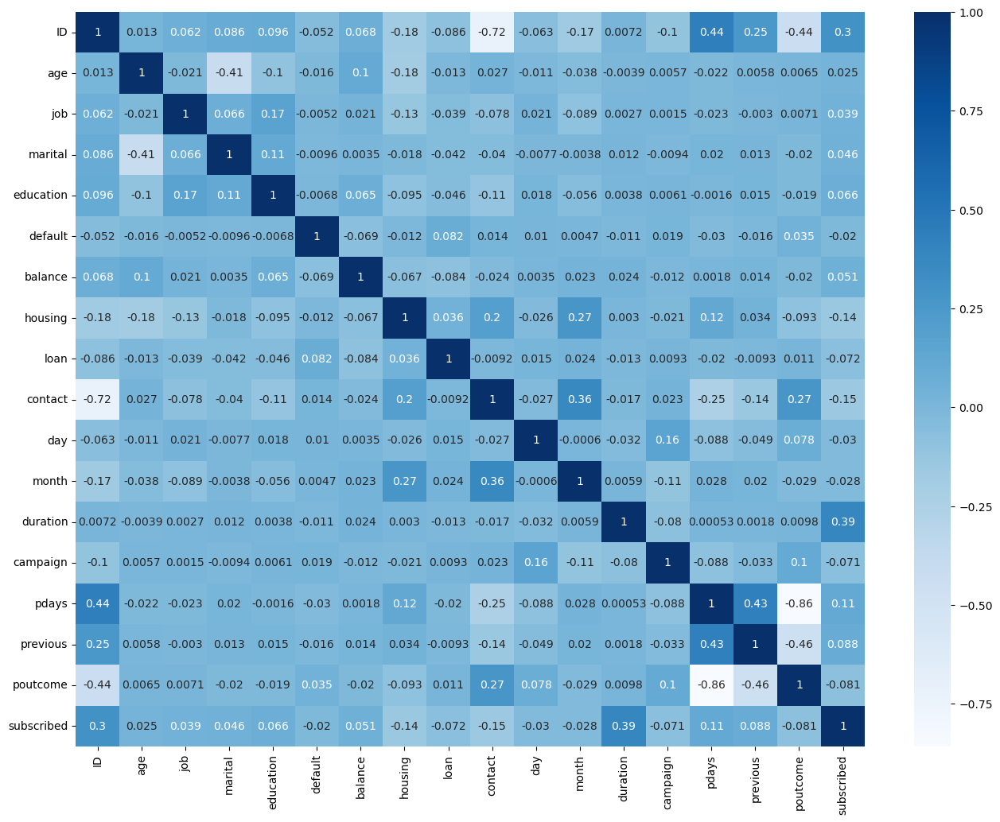

In [36]:
plt.figure(figsize=(16,12))
sns.heatmap(dfcor,cmap='Blues',annot=True)

Checking with pairplot for any correlation in the data

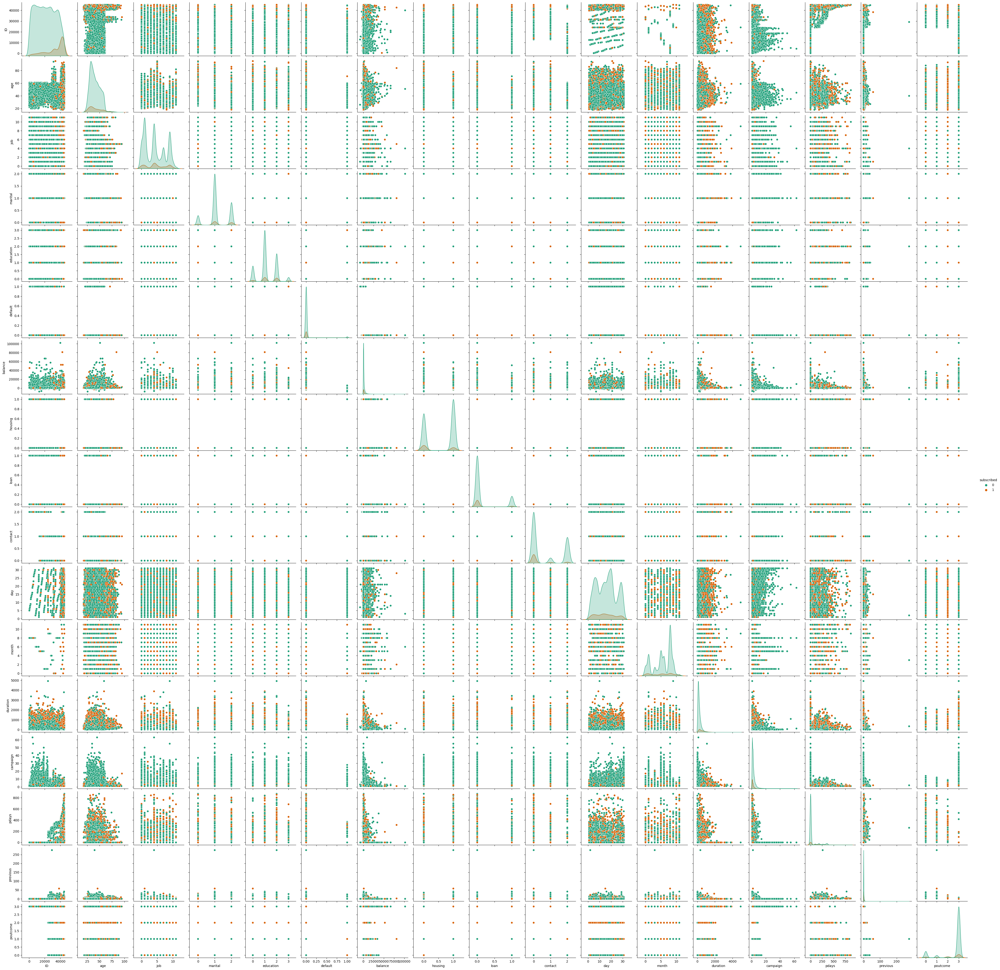

In [37]:
sns.pairplot(df,hue="subscribed", palette= "Dark2")
plt.show()

Observation- We can see slight skewness in the data some of the columns in the data shows the positive relation and some do not have any kind of relation

Checking for Outliers

ID                AxesSubplot(0.125,0.77;0.0824468x0.11)
age            AxesSubplot(0.223936,0.77;0.0824468x0.11)
job            AxesSubplot(0.322872,0.77;0.0824468x0.11)
marital        AxesSubplot(0.421809,0.77;0.0824468x0.11)
education      AxesSubplot(0.520745,0.77;0.0824468x0.11)
default        AxesSubplot(0.619681,0.77;0.0824468x0.11)
balance        AxesSubplot(0.718617,0.77;0.0824468x0.11)
housing        AxesSubplot(0.817553,0.77;0.0824468x0.11)
loan             AxesSubplot(0.125,0.638;0.0824468x0.11)
contact       AxesSubplot(0.223936,0.638;0.0824468x0.11)
day           AxesSubplot(0.322872,0.638;0.0824468x0.11)
month         AxesSubplot(0.421809,0.638;0.0824468x0.11)
duration      AxesSubplot(0.520745,0.638;0.0824468x0.11)
campaign      AxesSubplot(0.619681,0.638;0.0824468x0.11)
pdays         AxesSubplot(0.718617,0.638;0.0824468x0.11)
previous      AxesSubplot(0.817553,0.638;0.0824468x0.11)
poutcome         AxesSubplot(0.125,0.506;0.0824468x0.11)
subscribed    AxesSubplot(0.223

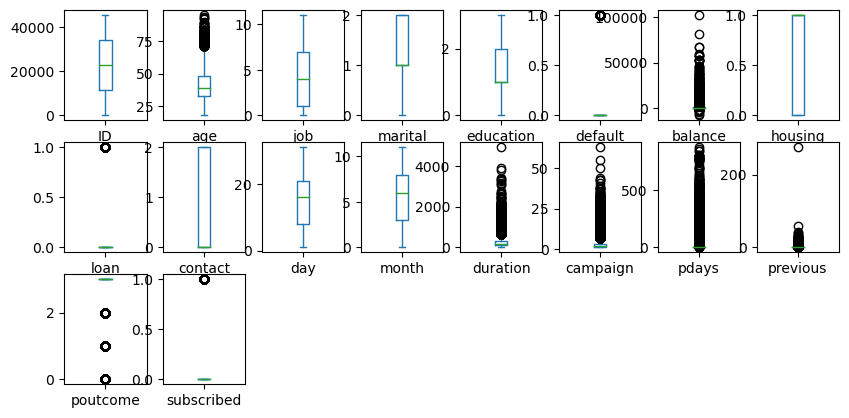

In [38]:
df.plot(kind='box',subplots=True,layout=(6,8),figsize=(10,10))

Observation- There are outliers present in the given data specifically in "age","balance","duration","campaign","pdays","previous","poutcome"

As mentioned in the problem statement seperating the data into x&y, where x is the input and y is the output

In [39]:
x=df.drop("subscribed", axis = 1)
y=df["subscribed"]

In [40]:
x

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,26110,56,0,1,3,0,1933,0,0,1,19,9,44,2,-1,0,3
1,40576,31,11,1,1,0,3,0,0,0,20,5,91,2,-1,0,3
2,15320,27,7,1,1,0,891,1,0,0,18,5,240,1,-1,0,3
3,43962,57,4,0,2,0,3287,0,0,0,22,6,867,1,84,3,2
4,29842,31,9,1,1,0,119,1,0,0,4,3,380,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,4,2,2,0,0,1,0,0,12,8,116,2,-1,0,3
31643,40178,53,4,0,2,0,380,0,1,0,5,6,438,2,-1,0,3
31644,19710,32,4,2,2,0,312,0,0,0,7,1,37,3,-1,0,3
31645,38556,57,9,1,1,0,225,1,0,1,15,8,22,7,337,12,0


In [41]:
y

0        0
1        0
2        0
3        1
4        0
        ..
31642    0
31643    1
31644    0
31645    0
31646    1
Name: subscribed, Length: 31647, dtype: int32

Removing outliers with the help of 'zscore'

In [42]:
from scipy.stats import zscore
z=np.abs(zscore(x))
z

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,0.271192,1.415793,1.324317,0.275405,2.369229,0.137234,0.187933,1.118201,0.439893,0.395076,0.379579,1.154007,0.832754,0.245906,0.408555,0.237059,0.441777
1,1.377516,0.937156,2.037729,0.275405,0.300345,0.137234,0.449397,1.118201,0.439893,0.716695,0.499526,0.177462,0.649957,0.245906,0.408555,0.237059,0.441777
2,0.554001,1.313627,0.815167,0.275405,0.300345,0.137234,0.156159,0.894294,0.439893,0.716695,0.259631,0.177462,0.070449,0.567059,0.408555,0.237059,0.441777
3,1.636469,1.509911,0.101755,1.922374,1.034442,0.137234,0.635055,1.118201,0.439893,0.716695,0.739422,0.155405,2.368149,0.567059,0.447299,1.001336,0.576498
4,0.556606,0.937156,1.426448,0.275405,0.300345,0.137234,0.411091,0.894294,0.439893,0.716695,1.419637,0.843197,0.474054,0.567059,0.408555,0.237059,0.441777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,1.064493,1.125392,0.101755,1.371563,1.034442,0.137234,0.450388,0.894294,0.439893,0.716695,0.460055,0.821140,0.552724,0.245906,0.408555,0.237059,0.441777
31643,1.347078,1.133439,0.101755,1.922374,1.034442,0.137234,0.324903,1.118201,2.273280,0.716695,1.299690,0.155405,0.699635,0.245906,0.408555,0.237059,0.441777
31644,0.218265,0.843038,0.101755,1.371563,1.034442,0.137234,0.347358,1.118201,0.439893,0.716695,1.059794,1.508931,0.859979,0.075247,0.408555,0.237059,0.441777
31645,1.223031,1.509911,1.426448,0.275405,0.300345,0.137234,0.376088,0.894294,0.439893,0.395076,0.100212,0.821140,0.918319,1.359859,2.994723,4.716521,2.613048


The data should lie well withing the range of 3. The data which is >3 we will see that first

In [43]:
threshold=3
print(np.where(z>3))

(array([   10,    21,    26, ..., 31622, 31645, 31646], dtype=int64), array([ 5, 13,  6, ..., 14, 15, 12], dtype=int64))


We will consider the data which is >3

In [44]:
df_new=x[(z<3).all(axis=1)]
df_new

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,26110,56,0,1,3,0,1933,0,0,1,19,9,44,2,-1,0,3
1,40576,31,11,1,1,0,3,0,0,0,20,5,91,2,-1,0,3
2,15320,27,7,1,1,0,891,1,0,0,18,5,240,1,-1,0,3
3,43962,57,4,0,2,0,3287,0,0,0,22,6,867,1,84,3,2
4,29842,31,9,1,1,0,119,1,0,0,4,3,380,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31640,12109,43,4,2,1,0,2968,0,0,2,20,6,30,4,-1,0,3
31641,9476,37,9,2,2,0,1309,0,0,2,6,6,442,2,-1,0,3
31642,36483,29,4,2,2,0,0,1,0,0,12,8,116,2,-1,0,3
31643,40178,53,4,0,2,0,380,0,1,0,5,6,438,2,-1,0,3


In [45]:
df=df_new

In [46]:
df

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,26110,56,0,1,3,0,1933,0,0,1,19,9,44,2,-1,0,3
1,40576,31,11,1,1,0,3,0,0,0,20,5,91,2,-1,0,3
2,15320,27,7,1,1,0,891,1,0,0,18,5,240,1,-1,0,3
3,43962,57,4,0,2,0,3287,0,0,0,22,6,867,1,84,3,2
4,29842,31,9,1,1,0,119,1,0,0,4,3,380,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31640,12109,43,4,2,1,0,2968,0,0,2,20,6,30,4,-1,0,3
31641,9476,37,9,2,2,0,1309,0,0,2,6,6,442,2,-1,0,3
31642,36483,29,4,2,2,0,0,1,0,0,12,8,116,2,-1,0,3
31643,40178,53,4,0,2,0,380,0,1,0,5,6,438,2,-1,0,3


Checking the skewness, as we seen in the pair plotthere is lot of skewness in the given dataset, checking and removing the skewness

In [47]:
df.skew()

ID           0.069698
age          0.439159
job          0.258302
marital     -0.095968
education    0.197092
default      0.000000
balance      2.433928
housing     -0.207765
loan         1.829242
contact      0.698882
day          0.075854
month       -0.469448
duration     1.596175
campaign     2.064222
pdays        2.799415
previous     3.657231
poutcome    -2.449518
dtype: float64

To remove skewness we will use the cube root method

In [48]:
df['previous']=np.cbrt(df['previous'])

Observation- As the skewness is removed from "previous" column the data will be changed.

In [49]:
df.skew()

ID           0.069698
age          0.439159
job          0.258302
marital     -0.095968
education    0.197092
default      0.000000
balance      2.433928
housing     -0.207765
loan         1.829242
contact      0.698882
day          0.075854
month       -0.469448
duration     1.596175
campaign     2.064222
pdays        2.799415
previous     2.275265
poutcome    -2.449518
dtype: float64

In [50]:
df['poutcome']=np.cbrt(df['poutcome'])

Observation- Still after removing the skewness form data there is column "poutcome" which shows the high number of skewness, hence removing that

In [51]:
df.skew()

ID           0.069698
age          0.439159
job          0.258302
marital     -0.095968
education    0.197092
default      0.000000
balance      2.433928
housing     -0.207765
loan         1.829242
contact      0.698882
day          0.075854
month       -0.469448
duration     1.596175
campaign     2.064222
pdays        2.799415
previous     2.275265
poutcome    -2.868674
dtype: float64

Observation- Now skewness is under control

Again checking the correaltion

In [52]:
df.corr()

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
ID,1.000000,-0.034078,0.069944,0.100766,0.118126,NaN,0.095436,-0.205183,-0.076859,-0.735424,-0.049406,-0.206776,0.013162,-0.087555,0.378083,0.431197,-0.334098
age,-0.034078,1.000000,-0.030442,-0.411279,-0.101482,NaN,0.093209,-0.155100,0.005722,0.031171,-0.010067,-0.041290,-0.026249,0.035203,-0.010056,0.001669,-0.001186
job,0.069944,-0.030442,1.000000,0.068169,0.171837,NaN,0.023775,-0.124102,-0.037678,-0.084352,0.021324,-0.087652,-0.001964,0.004321,0.002898,0.016931,-0.009247
marital,0.100766,-0.411279,0.068169,1.000000,0.112713,NaN,0.011066,-0.027720,-0.045605,-0.042390,-0.008776,-0.002910,0.015562,-0.022340,0.014704,0.024525,-0.009532
education,0.118126,-0.101482,0.171837,0.112713,1.000000,NaN,0.052312,-0.098381,-0.047816,-0.122955,0.016973,-0.057185,0.001121,-0.007422,0.026627,0.054989,-0.031654
default,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,0.095436,0.093209,0.023775,0.011066,0.052312,NaN,1.000000,-0.057183,-0.094902,-0.037444,0.009251,0.031738,0.032218,-0.014114,0.039717,0.061087,-0.051592
housing,-0.205183,-0.155100,-0.124102,-0.027720,-0.098381,NaN,-0.057183,1.000000,0.037213,0.214919,-0.013201,0.272980,0.011401,-0.040230,0.072516,0.010892,-0.062305
loan,-0.076859,0.005722,-0.037678,-0.045605,-0.047816,NaN,-0.094902,0.037213,1.000000,-0.011361,0.011915,0.027286,-0.010625,-0.002137,-0.006355,-0.016390,-0.006292
contact,-0.735424,0.031171,-0.084352,-0.042390,-0.122955,NaN,-0.037444,0.214919,-0.011361,1.000000,-0.027797,0.392408,-0.023682,0.003623,-0.240344,-0.258525,0.225994


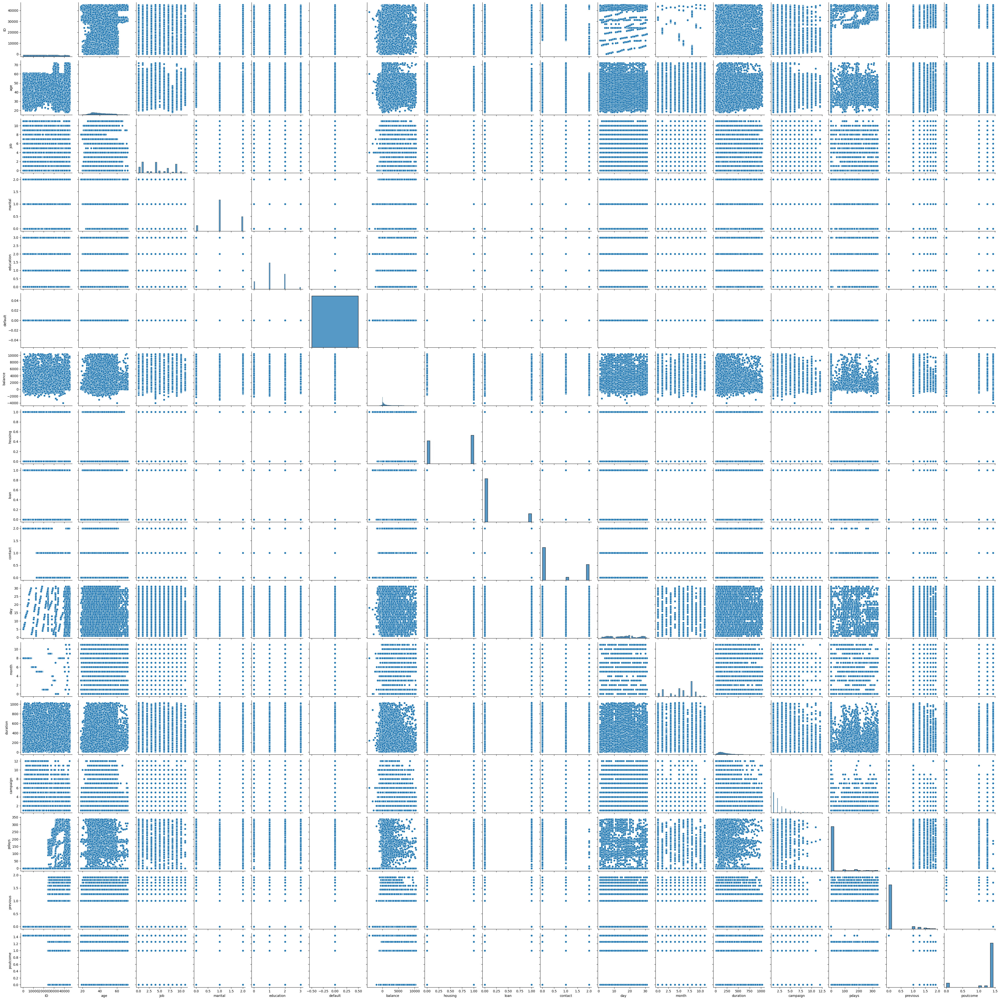

In [53]:
sns.pairplot(df)

As we can see in this pairplot skewness is removed 

Importing the standard scaler to scale the data

In [54]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,0.271192,1.415793,-1.324317,-0.275405,2.369229,-0.137234,0.187933,-1.118201,-0.439893,0.395076,0.379579,1.154007,-0.832754,-0.245906,-0.408555,-0.237059,0.441777
1,1.377516,-0.937156,2.037729,-0.275405,-0.300345,-0.137234,-0.449397,-1.118201,-0.439893,-0.716695,0.499526,-0.177462,-0.649957,-0.245906,-0.408555,-0.237059,0.441777
2,-0.554001,-1.313627,0.815167,-0.275405,-0.300345,-0.137234,-0.156159,0.894294,-0.439893,-0.716695,0.259631,-0.177462,-0.070449,-0.567059,-0.408555,-0.237059,0.441777
3,1.636469,1.509911,-0.101755,-1.922374,1.034442,-0.137234,0.635055,-1.118201,-0.439893,-0.716695,0.739422,0.155405,2.368149,-0.567059,0.447299,1.001336,-0.576498
4,0.556606,-0.937156,1.426448,-0.275405,-0.300345,-0.137234,-0.411091,0.894294,-0.439893,-0.716695,-1.419637,-0.843197,0.474054,-0.567059,-0.408555,-0.237059,0.441777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,1.064493,-1.125392,-0.101755,1.371563,1.034442,-0.137234,-0.450388,0.894294,-0.439893,-0.716695,-0.460055,0.821140,-0.552724,-0.245906,-0.408555,-0.237059,0.441777
31643,1.347078,1.133439,-0.101755,-1.922374,1.034442,-0.137234,-0.324903,-1.118201,2.273280,-0.716695,-1.299690,0.155405,0.699635,-0.245906,-0.408555,-0.237059,0.441777
31644,-0.218265,-0.843038,-0.101755,1.371563,1.034442,-0.137234,-0.347358,-1.118201,-0.439893,-0.716695,-1.059794,-1.508931,-0.859979,0.075247,-0.408555,-0.237059,0.441777
31645,1.223031,1.509911,1.426448,-0.275405,-0.300345,-0.137234,-0.376088,0.894294,-0.439893,0.395076,-0.100212,0.821140,-0.918319,1.359859,2.994723,4.716521,-2.613048


Checking the multicolinearity of the data, if not necessary we can remove the data too, but removing the data may lead to loss of information, hence we will not dro any columns as all are under control

In [55]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i)
                  for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,2.727403,ID
1,1.288763,age
2,1.050533,job
3,1.234212,marital
4,1.067492,education
5,1.014385,default
6,1.036378,balance
7,1.215295,housing
8,1.036707,loan
9,2.523665,contact


In [56]:
y.value_counts()

0    27932
1     3715
Name: subscribed, dtype: int64

Importing all the important logistic libaray

In [57]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import accuracy_score
maxAccu = 0 
maxRS = 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    RFR =RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
        
print("Best accuracy is",maxAccu,"at random_state",maxRS)


Best accuracy is 0.9178515007898894 at random_state 46


Spliting the data in x_train,x_test and y_train,y_test

In [60]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxRS)

In [61]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score

In [62]:
RFC= RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9163770405476567
[[8137  263]
 [ 531  564]]
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      8400
           1       0.68      0.52      0.59      1095

    accuracy                           0.92      9495
   macro avg       0.81      0.74      0.77      9495
weighted avg       0.91      0.92      0.91      9495



Observation- The model is giving 91.63% accuracy

In [63]:
LR= LogisticRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.90173775671406
[[8234  166]
 [ 767  328]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.95      8400
           1       0.66      0.30      0.41      1095

    accuracy                           0.90      9495
   macro avg       0.79      0.64      0.68      9495
weighted avg       0.89      0.90      0.88      9495



Observation- The model is giving 90.17% accuracy

In [64]:
svc= SVC()
svc.fit(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.9080568720379147
[[8232  168]
 [ 705  390]]
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      8400
           1       0.70      0.36      0.47      1095

    accuracy                           0.91      9495
   macro avg       0.81      0.67      0.71      9495
weighted avg       0.90      0.91      0.89      9495



Observation- The model is giving 90.80% accuracy

In [65]:
GB= GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.9169036334913112
[[8129  271]
 [ 518  577]]
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      8400
           1       0.68      0.53      0.59      1095

    accuracy                           0.92      9495
   macro avg       0.81      0.75      0.77      9495
weighted avg       0.91      0.92      0.91      9495



Observation- The model is giving 91.69% accuracy

Checking the cross val score

In [66]:
from sklearn.model_selection import cross_val_score

In [67]:
score=cross_val_score(RFC,x,y)
print(score)
print(score.mean())
print("The difference between accuracy score and cross validation score is - ",accuracy_score(y_test,predRFC)- score.mean())

[0.91421801 0.91153239 0.90867436 0.91309844 0.9112024 ]
0.9117451176996383
The difference between accuracy score and cross validation score is -  0.004631922848018388


In [68]:
score=cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("The difference between accuracy score and cross validation score is - ",accuracy_score(y_test,predLR)- score.mean())

[0.90094787 0.89699842 0.89761416 0.89903618 0.89919419]
0.89875816254424
The difference between accuracy score and cross validation score is -  0.0029795941698199657


In [70]:
score=cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("The difference between accuracy score and cross validation score is - ",accuracy_score(y_test,predRFC)- score.mean())

[0.907109   0.90268562 0.90188023 0.90282825 0.90614631]
0.9041298848276582
The difference between accuracy score and cross validation score is -  0.01224715571999846


In [71]:
score=cross_val_score(GB,x,y)
print(score)
print(score.mean())
print("The difference between accuracy score and cross validation score is - ",accuracy_score(y_test,predRFC)- score.mean())

[0.91406003 0.91058452 0.90804234 0.91294043 0.91057039]
0.9112395435440114
The difference between accuracy score and cross validation score is -  0.005137497003645297


We will use GB model to predict whether the coustomer will say "yes" or "no"